<center>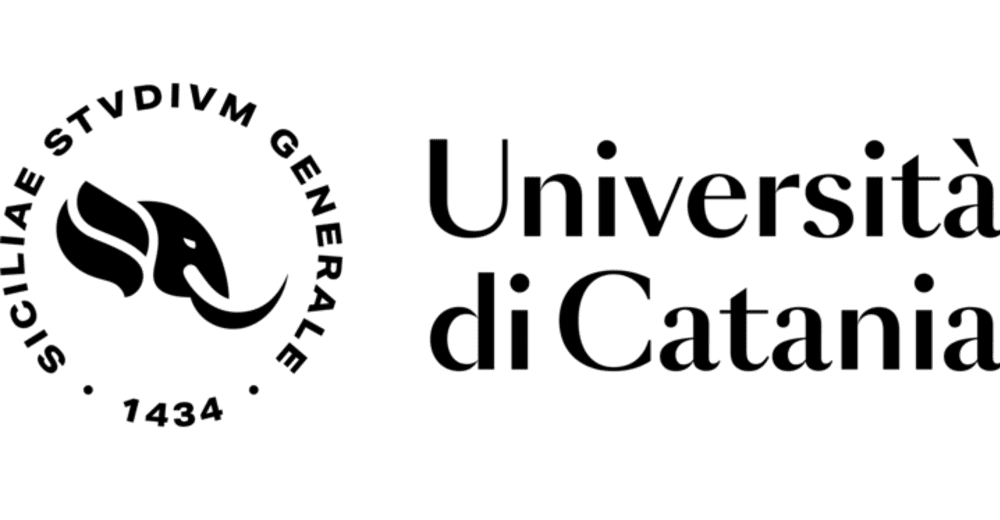

<center><h3>DATA SCIENCE FOR MANAGEMENT - LM 91</h3>
<h1>Covid-19 Analysis on GCP</h1>

# Introduction
The COVID-19 pandemic of 2019-2020 is the current pandemic of the so-called “new coronavirus disease“, caused by the SARS-CoV-2 virus. 
Patients experience flu-like symptoms such as dermatitis, fever, dry cough, tiredness, difficulty breathing. In the most serious cases, often found in subjects already burdened by previous pathologies, pneumonia develops, acute renal failure, up to even death.
Patients also have leukopenia and lymphocytopenia. A test to diagnose SARS-CoV-2 infection has been available since mid-January 2020, but specific treatments and vaccines are currently being researched and tested.
The healings are spontaneous and the treatments are mainly aimed at managing symptoms and supporting vital functions even if some antiviral drugs already used to contrast other infections have been tested.

The aim of this project is to analyze data about COVID-19 using Google Cloud Platform.

# 1. The datasets
Data are stored in two GitHub repositories:
- [Dipartimento di Protezione Civile](https://github.com/pcm-dpc/COVID-19) ([Region](https://github.com/pcm-dpc/COVID-19/blob/master/dati-regioni/dpc-covid19-ita-regioni.csv) and [Province](https://github.com/pcm-dpc/COVID-19/blob/master/dati-province/dpc-covid19-ita-province.csv)) that stores data about:

- Regional data

| Fields                                 | Type     | Description                                |
|----------------------------------------|----------|--------------------------------------------|
| data                                   | datetime | Date of update                             | 
| nuovi_casi                             | integer  | New positive cases                         | 
| totale_casi                            | integer  | Total number of cases                      | 
| totale_positivi                        | integer  | Total number of positive cases             | 
| tamponi                                | integer  | Total number of tests                      | 
| tamponi_test_antigenico_rapido         | integer  | Number of rapid tests                      | 
| totale_positivi_test_antigenico_rapido | integer  | Number of positive related to rapid tests  | 
| tamponi_test_molecolare                | integer  | Number of PCR tests                        | 
| totale_positivi_test_molecolare        | integer  | Number of positive related to PCR tests    | 
| ingressi_terapia_intensiva             | integer  | Admission to intensive care                | 
| terapia_intensiva                      | integer  | Number of cases in intensive care          | 
| totale_ospedalizzati                   | integer  | Total number of hospitalized cases         | 
| ricoverati_con_sintomi                 | integer  | Total number of hospitalized with symptoms |
| dimessi_guariti                        | integer  | Number of patients healed                  | 
| isolamento_domiciliare                 | integer  | Cases in home isolation                    | 
| deceduti                               | integer  | Number of deaths                           | 

- Province data

| Fields                  | Type     | Description           |
|-------------------------|----------|-----------------------|
| data                    | datetime | Date of update        | 
| denominazione_regione   | string   | Region name           | 
| denominazione_provincia | string   | Province name         | 
| totale_casi             | integer  | Total number of cases | 

- [Commissario straordinario per l'emergenza Covid-19](https://github.com/italia/covid19-opendata-vaccini) - about [vaccines](https://github.com/italia/covid19-opendata-vaccini/blob/master/dati/somministrazioni-vaccini-latest.csv) - that stores all the data related to vaccinations:

| Fields                | Type     | Description                                                                                      |
|-----------------------|----------|--------------------------------------------------------------------------------------------------|
| fornitore             | string   | Full name of the vaccine supplier                                                                |
| data_somministrazione | datetime | Date of administration                                                                           |
| fascia_anagrafica     | string   | Age range of the subjects to which the vaccine was administered                                  |
| sesso_maschile        | integer  | Total of male subjects to which the vaccine has been administered by day, region and age group   |
| sesso_femminile       | integer  | Total of female subjects to which the vaccine has been administered by day, region and age group |
| prima_dose            | integer  | Number of first shots                                                                            |
| seconda_dose          | integer  | Number of second shots                                                                           |
| nome_regione          | string   | Standard area name (where a bilingual naming required)                                           |

# 2. The workflow
Here we describe the cloud workflow to download and update the data automatically from GitHub repository, the analysis using Notebooks and Plotly for data visualization.
![workflow.png](attachment:workflow.png)

## 2.1 Google Cloud Platform
In Google Cloud create a new project naming it "covid-19-analysis"

## 2.2 Google Cloud Storage
1. In Google Cloud Storage create a new bucket and naming it "downloaded_data"
2. Leave everything default and click on CREATE to create the bucket

## 2.3 Google CLoud Functions
1. In Google Cloud Functions we create a new functions and name it as "download_data_from_github"
2. Select Cloud Pub/Sub as trigger
3. We need to select the topic, in our case we need to create a new one clicking on CREATE A TOPIC
4. We name the Topic ID as "download_data" and CREATE TOPIC
5. We want also to retry on failure
6. Add three environment variables
- URL
- FILE_NAME
- BUCKET
7. Click on NEXT

In the function itself we need to specify the programming language (in our case Python 3.7) and of course we need to code the function (which can be found [here](https://github.com/ternarydata/gcp-download-file-to-bigquery/tree/master/cf1_get_file_upload_to_gcs)).

So:
1. Select Python 3.7 as runtime
2. In the main.py script we code the function to download the file from the GitHub repository
3. Set the entrypoint "import_file"

In [ ]:
import os
import wget

from google.cloud import storage

url = os.environ['URL']
bucket_name = os.environ['BUCKET'] #without gs://
file_name = os.environ['FILE_NAME']

cf_path = '/tmp/{}'.format(file_name)

def import_file(event, context):
    # set storage client
    client = storage.Client()

    # get bucket
    bucket = client.get_bucket(bucket_name)

    # download the file to Cloud Function's tmp directory
    wget.download(url, cf_path)

    # set Blob
    blob = storage.Blob(file_name, bucket)
 
    # upload the file to GCS
    blob.upload_from_filename(cf_path)

    print("""This Function was triggered by messageId {} published at {}""".format(context.event_id, context.timestamp))

Also we need to add the required library for function dependencies:
1. Insert the function dependencies
2. DEPLOY the function

In [ ]:
# Function dependencies, for example:
# package>=version

google-cloud-storage
wget

To test the function:
1. Leave everything default just click on TEST THE FUNCTION
2. The function execution started
3. When the function is finished return the status ‘’ok’’
4. Replicate the previous steps for the other files

If everything worked correctly now you should fine in the Bucket the downloaded files.

## 2.4 Google Cloud Scheduler
1. Click on CREATE JOB to create a new schedule
2. Choose where the Cloud Scheduler jobs live
3. Put name, description, frequency and timezone (in our case it runs every day at 20 PM) 
4. Select Pub/Sub as target
5. Select the topic previously created
6. Insert the Message Body
7. Insert how many attempts and max retry durations
8. CREATE the schedule

The job has been scheduled but not run yet.
Click on RUN NOW to execute the job!

Repeat for the other schedules!

## 2.5 Google Cloud BigQuery
First we need to create the Dataset:
1. In Google BigQuery we select the project and Create dataset
2. Insert the id for Dataset ID and we choose "dataset"
3. Click on CREATE DATASET to create the dataset

Then we need to create the tables:
1. CREATE TABLE to create a table in the dataset
2. As source we use Google Cloud Storage and Browse the file in the bucket
3. We select the Bucket and the corresponding file
4. Insert the table name and auto-detect the schema
5. Click on CREATE TABLE to create the table
6. Repeat the previous steps for the other files

### 2.5.1 Google Cloud BigQuery (Data transfer)
To transfer the data from the bucket to the table in BigQuery we need to use Data transfer:
1. Select the type of Data Transfer (in our case Google Cloud Storage)
2. Insert the name and schedule options
3. Select the destionation dataset ID
4. Select the destionation table
5. Select the Google Cloud Storage URI
6. Select the Bucket and the file
7. To overwrite the entire table select MIRROR
8. Insert the delimiter character and skip the first header row
9. Click on SAVE

# 3. Descriptive analysis

In [ ]:
pip -q install plotly

In [ ]:
# Import libraries
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

## 3.1 Load data from BigQuery

In [ ]:
from google.cloud import bigquery

# Create a "Client" object
PROJECT = 'covid-19-analysis-318015'
client = bigquery.Client(project=PROJECT)

As we know the dataset contains three tables:
- regioni
- province
- vaccine

## 3.2 Create the dataframe from Regional data

So we can query the data from the tables time to time and explore data.

We start with regional data:

In [ ]:
query = """
        SELECT *
        FROM `covid-19-analysis-318015.dataset.regioni`
        """

# Set up the query 
query_job = client.query(query)

# API request - try to run the query, and return a pandas DataFrame
df_regioni = query_job.to_dataframe()
df_regioni.head(10)

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,...,note,ingressi_terapia_intensiva,note_test,note_casi,totale_positivi_test_molecolare,totale_positivi_test_antigenico_rapido,tamponi_test_molecolare,tamponi_test_antigenico_rapido,codice_nuts_1,codice_nuts_2
0,2020-02-24 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
1,2020-02-25 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
2,2020-02-26 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
3,2020-02-27 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
4,2020-02-28 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
5,2020-02-29 17:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
6,2020-03-01 17:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
7,2020-03-02 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
8,2020-03-03 18:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None
9,2020-03-04 17:00:00+00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,0,0,0,0,...,None,NaN,None,None,NaN,NaN,NaN,NaN,None,None


In [ ]:
df_regioni.shape

(10374, 30)

So we have 30 colomuns (variables) and 10353 rows (records).

Now we try to understand the percentage of null values:

In [ ]:
df_regioni.isnull().mean().round(4).mul(100).sort_values(ascending=False)

note_test                                 98.62
note_casi                                 95.58
note                                      86.02
casi_da_sospetto_diagnostico              67.21
casi_da_screening                         67.21
codice_nuts_1                             65.99
tamponi_test_antigenico_rapido            65.99
tamponi_test_molecolare                   65.99
totale_positivi_test_antigenico_rapido    65.99
totale_positivi_test_molecolare           65.99
codice_nuts_2                             65.99
ingressi_terapia_intensiva                57.29
casi_testati                              11.13
variazione_totale_positivi                 0.00
codice_regione                             0.00
denominazione_regione                      0.00
lat                                        0.00
long                                       0.00
ricoverati_con_sintomi                     0.00
terapia_intensiva                          0.00
totale_ospedalizzati                    

Considering that many data are null, we decided to exclude from the analysis the columns related to:
- note_test
- note_casi
- note
- codice_nuts_1
- codice_nuts_2

But also we can exclude from the analysis longitude and latitude, codice_regione and stato, casi_da_sospetto_diagnostico, casi_da_screening, casi_testati, variazione_totale_positivi.

In [ ]:
df_regioni = df_regioni.drop(['note_test', 'note_casi', 'note','codice_nuts_1','codice_nuts_2','lat', 'long', 'codice_regione', 'stato', 'casi_da_sospetto_diagnostico', 'casi_da_screening', 'casi_testati', 'variazione_totale_positivi'], axis=1)

Another problem is related to the date, we must change the format to Year, Month and day so we need to exclude the hour part.

In [ ]:
df_regioni["data"] = df_regioni["data"].dt.strftime("%y-%m-%d")
df_regioni.describe()

,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_positivi,nuovi_positivi,dimessi_guariti,deceduti,totale_casi,tamponi,ingressi_terapia_intensiva,totale_positivi_test_molecolare,totale_positivi_test_antigenico_rapido,tamponi_test_molecolare,tamponi_test_antigenico_rapido
count,10374.000000,10374.000000,10374.000000,10374.000000,10374.000000,10374.000000,10374.000000,10374.000000,10374.000000,1.037400e+04,4431.000000,3528.000000,3528.000000,3.528000e+03,3.528000e+03
mean,670.176595,78.352709,748.529304,11511.150472,12259.679776,410.175053,59703.847407,2910.269038,74873.799692,1.136174e+06,6.838863,163715.288549,4715.651644,1.960610e+06,4.934520e+05
std,1225.527216,136.978400,1357.713725,20598.828006,21545.156027,809.213488,113944.798350,5219.477116,130613.505359,1.776501e+06,9.301726,168586.150575,9021.569620,1.888393e+06,6.424012e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,-229.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,7382.000000,0.000000,6.615200e+04,0.000000e+00
25%,37.000000,4.000000,41.250000,396.250000,468.000000,13.000000,2193.250000,291.000000,3524.250000,1.039798e+05,1.000000,42302.750000,0.000000,6.089590e+05,4.083225e+04
50%,195.000000,24.000000,220.000000,2519.500000,2962.500000,91.000000,10640.500000,939.500000,18723.000000,3.895270e+05,3.000000,89858.000000,272.500000,1.142466e+06,2.157840e+05
75%,676.000000,87.750000,761.000000,11025.750000,12098.000000,412.000000,58953.000000,3469.750000,76941.000000,1.315484e+06,10.000000,245030.750000,7827.750000,2.953494e+06,6.647438e+05
max,12077.000000,1381.000000,13328.000000,155066.000000,164406.000000,11489.000000,797737.000000,33782.000000,841961.000000,1.162498e+07,86.000000,787842.000000,54119.000000,9.406322e+06,3.020947e+06


In [ ]:
df_regioni.shape

(10374, 17)

### 3.2.1 National totals
Just removing the regions and group by date, we can sum up national totals

In [ ]:
df_totali = df_regioni.drop(['denominazione_regione'], axis=1)
df_totali = df_totali.groupby(['data']).sum().reset_index()

To avoid code repetition we defined some functions to automate the creation of the plots:

In [ ]:
def lineplot_plotly(variable, title):
    fig = px.line(df_totali, x='data', y=variable, title=title)
    fig.show()

def boxplot_plotly(variable, title, y_axis_label):
    fig = px.box(df_totali, y=variable)
    fig.update_layout(title=title, yaxis_title=y_axis_label)
    fig.show()

#### 3.2.1.1 Total cases and positive cases
The first plots we want to show are related to the totality of cases and positive cases in Italy:

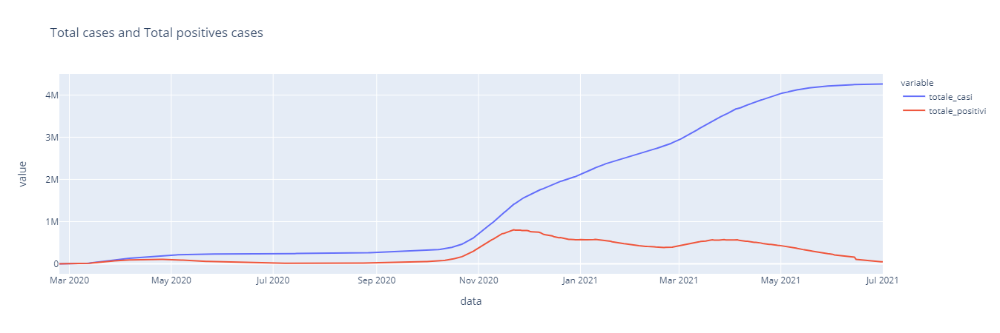

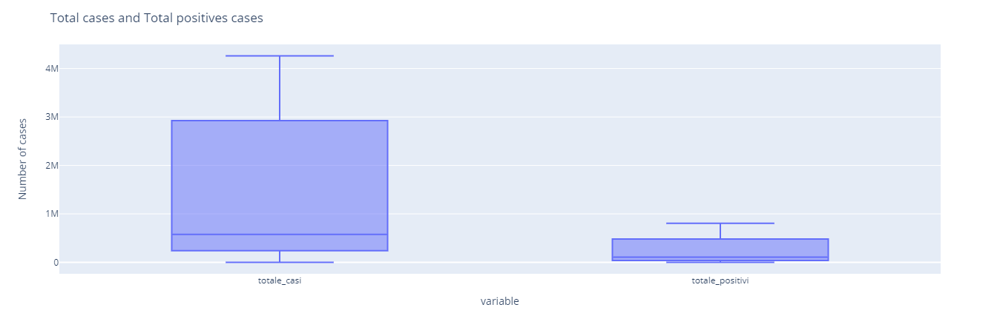

In [ ]:
lineplot_plotly(variable = ['totale_casi','totale_positivi'], title='Total cases and Total positives cases')
boxplot_plotly(variable = ['totale_casi','totale_positivi'], title='Total cases and Total positives cases', y_axis_label = 'Number of cases' )

#### 3.2.1.2 Total tests and positive cases
Here we plots all the type of tests, we want to show the dimensionality of the phenomena related to tests:

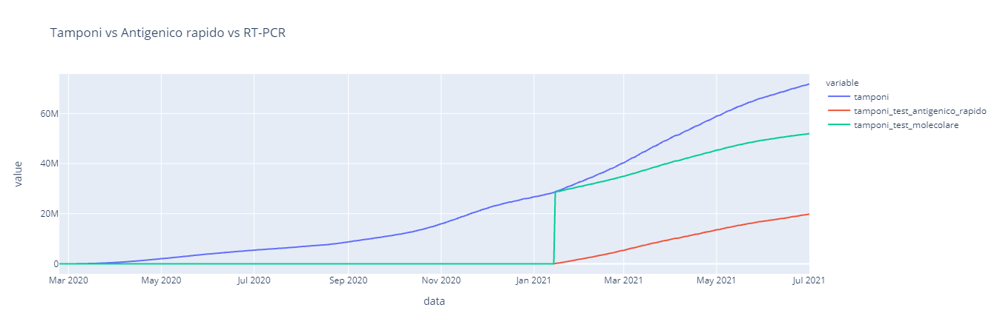

In [ ]:
lineplot_plotly(variable = ['tamponi','tamponi_test_antigenico_rapido','tamponi_test_molecolare'], title='Tamponi vs Antigenico rapido vs RT-PCR')

At half January 2021 the dataset is far more complete because it will explain the difference between fast test and PCR, so the term "Tamponi" at the end is the sum of the two tests.

And we can also see how many of these are positive to tests:

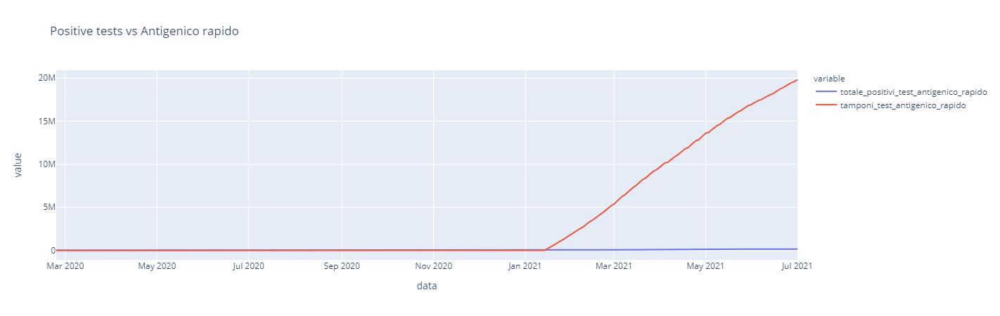

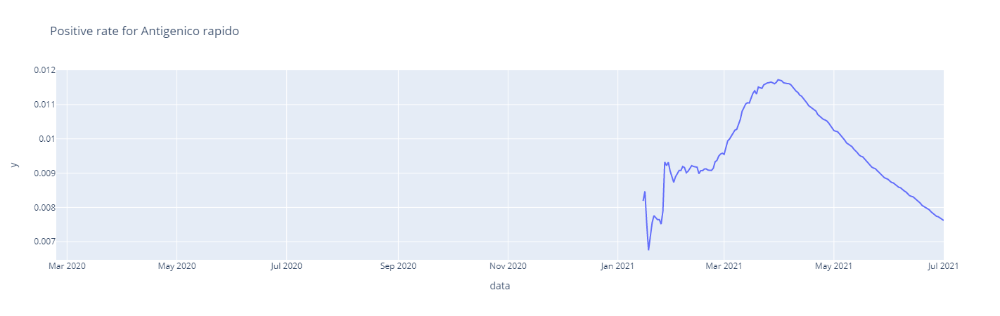

In [ ]:
lineplot_plotly(variable = ['totale_positivi_test_antigenico_rapido','tamponi_test_antigenico_rapido'], title='Positive tests vs Antigenico rapido')
lineplot_plotly(variable = df_totali['totale_positivi_test_antigenico_rapido']/df_totali['tamponi_test_antigenico_rapido'], title='Positive rate for Antigenico rapido')

From the last plot we can see that the positive rate is very low, and also is decreasing starting the month of April.

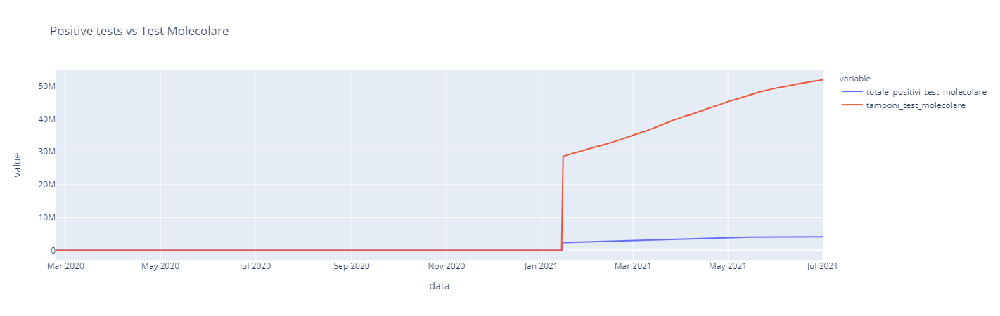

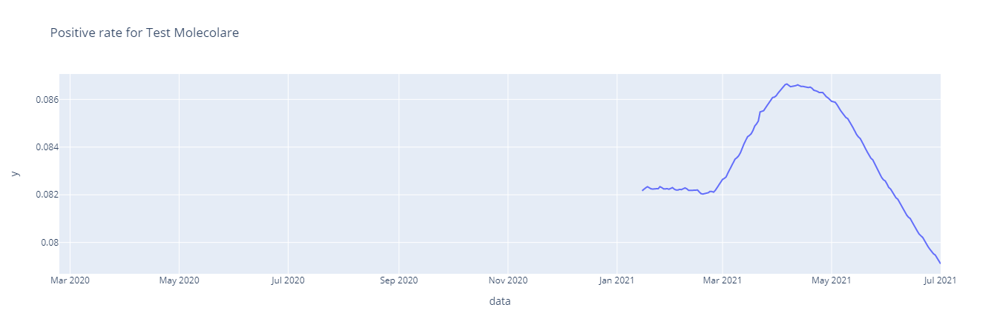

In [ ]:
lineplot_plotly(variable = ['totale_positivi_test_molecolare','tamponi_test_molecolare'], title='Positive tests vs Test Molecolare')
lineplot_plotly(variable = df_totali['totale_positivi_test_molecolare']/df_totali['tamponi_test_molecolare'], title='Positive rate for Test Molecolare')

The same trend applies to PCR, where positive rate is lower than 0.08%.

#### 3.2.1.3 Hospitalization, intensive care and hospitalized with symptoms
Here we try to understand the trend for Hospitalization, intensive care and hospitalized with symptoms.
The variable 'totale_ospedalizzati' is the some of intensive care and hospitalized with symptoms, and as we can see there is a decreasing trend starting from April.
We can also spot how many admissions have been done during the last six months, admissions are very low compared to the total hospitalization.

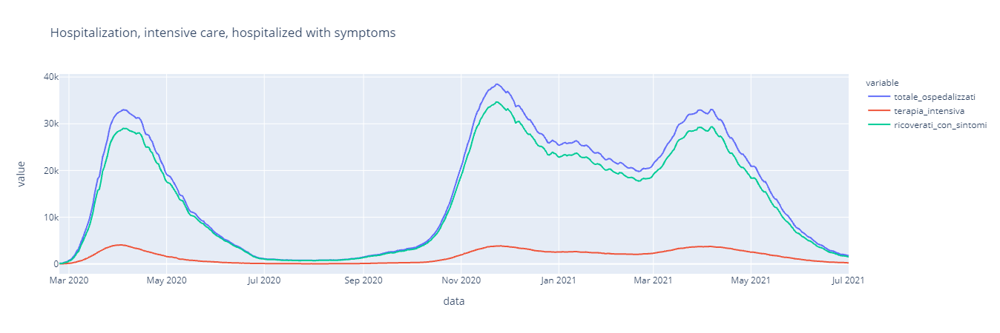

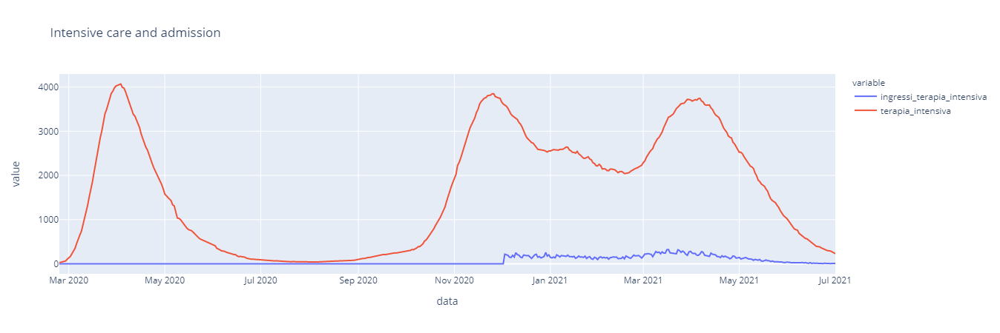

In [ ]:
lineplot_plotly(variable = ['totale_ospedalizzati','terapia_intensiva', 'ricoverati_con_sintomi'], title='Hospitalization, intensive care, hospitalized with symptoms')
lineplot_plotly(variable = ['ingressi_terapia_intensiva','terapia_intensiva'], title='Intensive care and admission')

#### 3.2.1.4 Total positive cases, home isolation and healed
Here we try to understand the trend for positive cases, home isolation and healed.

What this lineplot shows us is that there is a growing of healed respect to the number of positive cases which also have the exact same trend of people in home isolation.

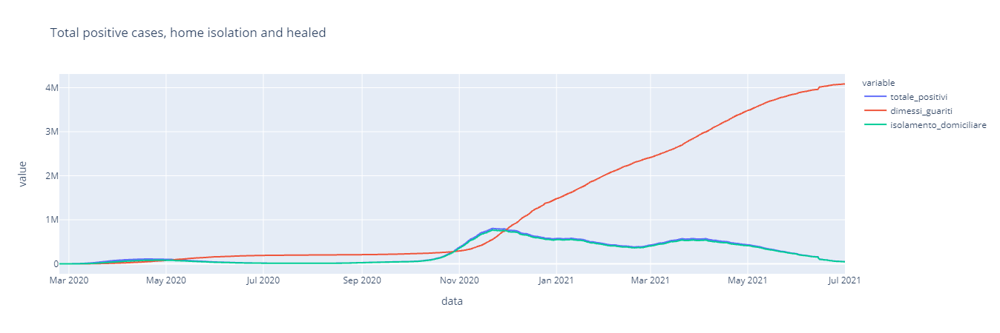

In [ ]:
lineplot_plotly(variable = ['totale_positivi','dimessi_guariti','isolamento_domiciliare'], title='Total positive cases, home isolation and healed')

#### 3.2.1.5 Total positive cases and deaths
Here we try to understand the trend for positive cases and deaths.

As we can see here the number of death cases is "costant" although the number is getting bigger but it does not reflect the fact that there is correlation between number of positives and deaths.

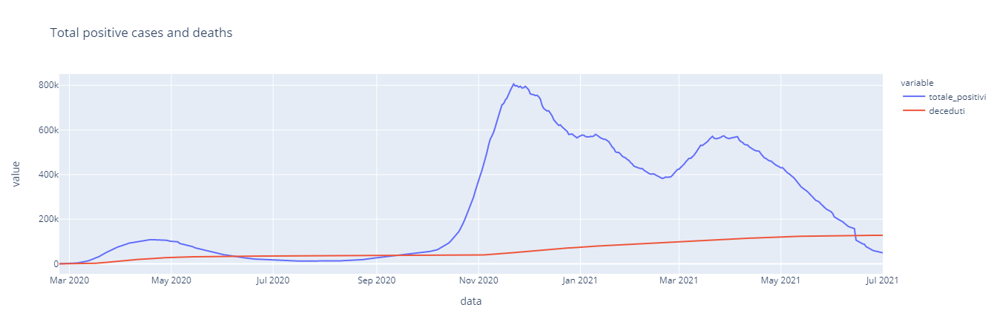

In [ ]:
lineplot_plotly(variable = ['totale_positivi','deceduti'], title='Total positive cases and deaths')

### 3.2.2 Cases by Region
Here we make some plots about cases by Region

In [ ]:
def multiple_boxplot(dataset, subject, variable, title_box, x_label_box, y_label_box, ):
    fig = px.box(dataset, x=subject, y=variable, color=subject)
    fig.update_layout(title=title_box, xaxis_title=x_label_box, yaxis_title=y_label_box)
    fig.show()
    
def multiple_lineplot(dataset, subject, variable, title_line, y_label_line):
    fig = px.line(dataset, x='data', y=variable, color=subject)
    fig.update_layout(title=title_line, xaxis_title='Date', yaxis_title=y_label_line)
    fig.show()

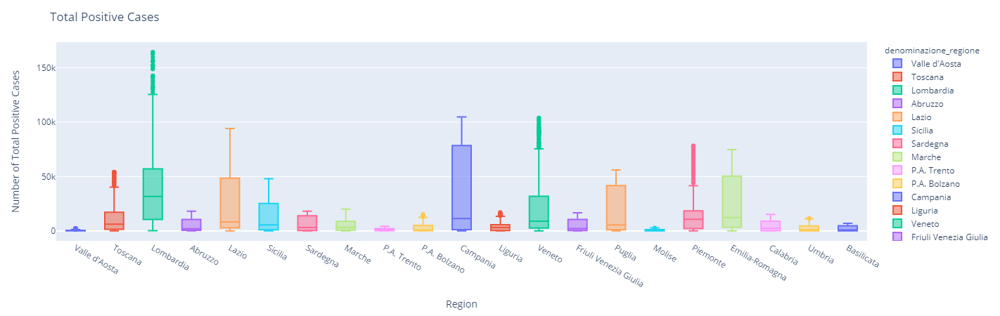

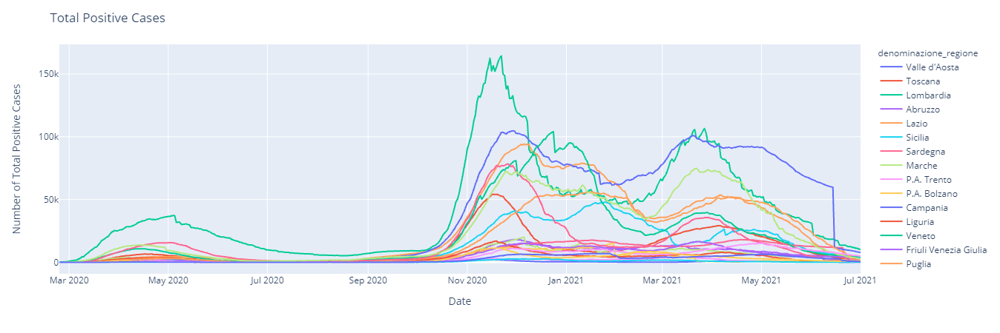

In [ ]:
multiple_boxplot(dataset = df_regioni, subject='denominazione_regione', variable='totale_positivi', title_box='Total Positive Cases', x_label_box='Region',y_label_box='Number of Total Positive Cases')
multiple_lineplot(dataset = df_regioni, subject='denominazione_regione', variable='totale_positivi', title_line='Total Positive Cases', y_label_line='Number of Total Positive Cases')

#### 3.2.2.1 Total cases by Province
Here we make some plots about cases by Province

In [ ]:
query = """
        SELECT *
        FROM `covid-19-analysis-318015.dataset.province`
        """

# Set up the query 
query_job = client.query(query)

# API request - try to run the query, and return a pandas DataFrame
df_province = query_job.to_dataframe()
df_province = df_province.drop(['stato', 'codice_regione', 'codice_provincia','sigla_provincia','lat', 'long','note','codice_nuts_1','codice_nuts_2','codice_nuts_3'], axis=1)
df_province["data"] = df_province["data"].dt.strftime("%y-%m-%d")
df_province.head(10)

,data,denominazione_regione,denominazione_provincia,totale_casi
0,20-02-24,Lazio,Viterbo,0
1,20-02-25,Lazio,Viterbo,0
2,20-02-26,Lazio,Viterbo,0
3,20-02-27,Lazio,Viterbo,0
4,20-02-28,Lazio,Viterbo,0
5,20-02-29,Lazio,Viterbo,0
6,20-03-01,Lazio,Viterbo,0
7,20-03-02,Lazio,Viterbo,0
8,20-03-03,Lazio,Viterbo,0
9,20-03-04,Lazio,Viterbo,0


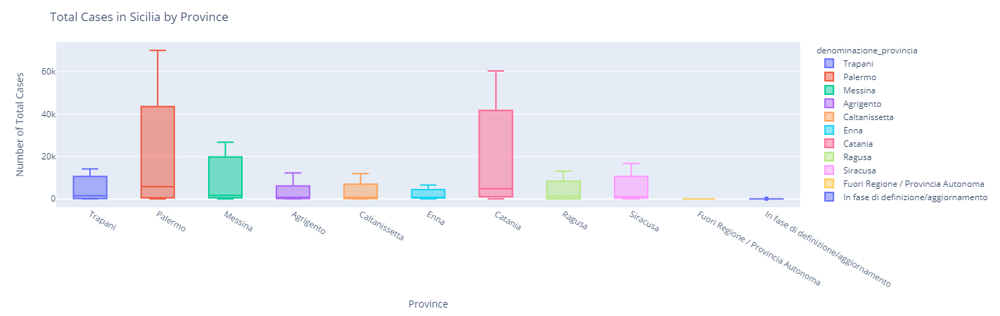

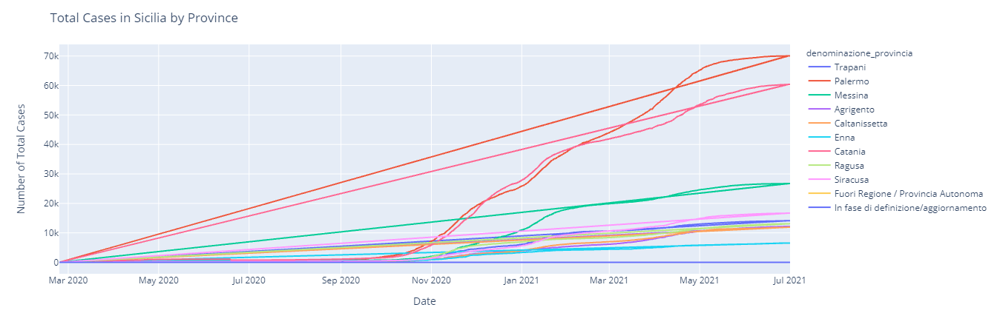

In [ ]:
multiple_boxplot(dataset = df_province[df_province['denominazione_regione'] == 'Sicilia'], subject='denominazione_provincia', variable='totale_casi', title_box='Total Cases in Sicilia by Province', x_label_box='Province', y_label_box='Number of Total Cases')
multiple_lineplot(dataset = df_province[df_province['denominazione_regione'] == 'Sicilia'], subject='denominazione_provincia', variable='totale_casi', title_line='Total Cases in Sicilia by Province', y_label_line='Number of Total Cases')

#### 3.2.2.2 Total tests and positive cases
Here we compare the total number of cases to tests and understand the positive rate:

In [ ]:
df_regioni_date = df_regioni[df_regioni['data'] == '21-06-30']

def group_barplot(name, x, y, name1, y1, title):
    fig = go.Figure(data=[
        go.Bar(name=name, x=x, y=y),
        go.Bar(name=name1, x=x, y=y1)
        ])
    # Change the bar mode
    fig.update_layout(title=title, xaxis_title='Region', yaxis_title='Number of cases', barmode='group')
    fig.show()

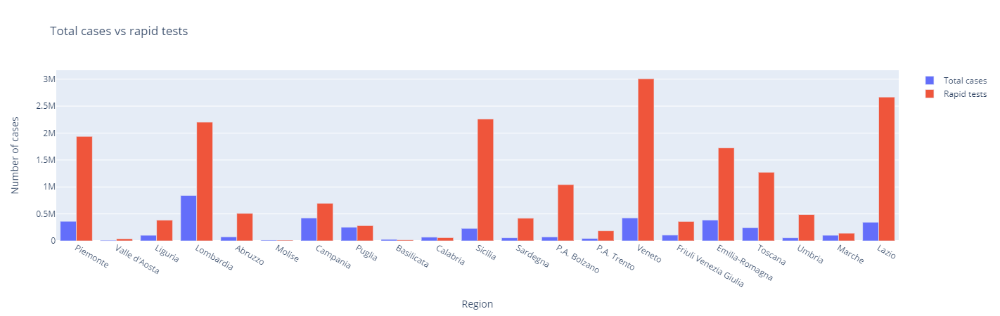

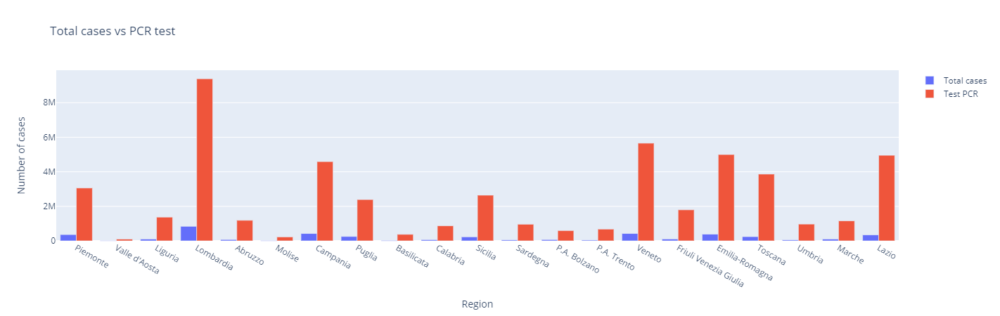

In [ ]:
group_barplot(name='Total cases', x=df_regioni_date['denominazione_regione'], y=df_regioni_date['totale_casi'],
             name1='Rapid tests', y1=df_regioni_date['tamponi_test_antigenico_rapido'],
             title='Total cases vs rapid tests')

group_barplot(name='Total cases', x=df_regioni_date['denominazione_regione'], y=df_regioni_date['totale_casi'],
             name1='Test PCR', y1=df_regioni_date['tamponi_test_molecolare'],
             title='Total cases vs PCR test')

And we can also see how many of these are positive to tests:

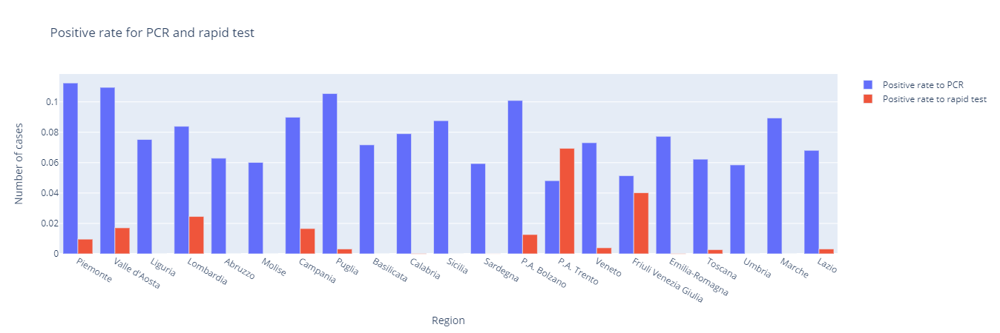

In [ ]:
group_barplot(name='Positive rate to PCR', x=df_regioni_date['denominazione_regione'], y=df_regioni_date['totale_positivi_test_molecolare']/df_regioni_date['tamponi_test_molecolare'],
             name1='Positive rate to rapid test', y1=df_regioni_date['totale_positivi_test_antigenico_rapido']/df_regioni_date['tamponi_test_antigenico_rapido'],
             title='Positive rate for PCR and rapid test')

#### 3.2.2.3 Total cases in intensive care and admission to intensive care today
Here we describe using two piechart the total cases in intensive care and admission to intensive care today

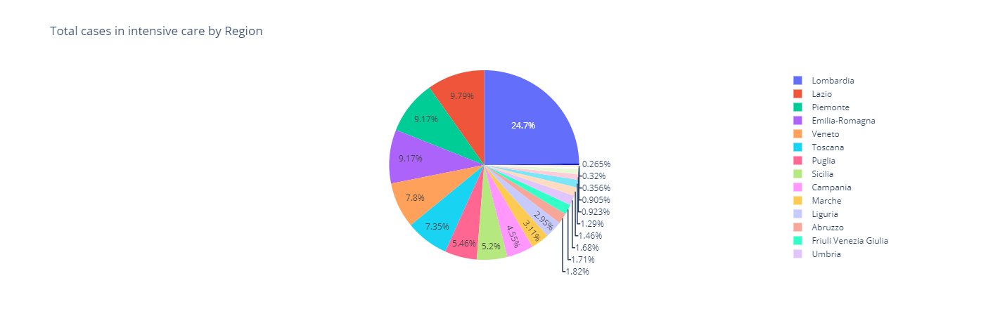

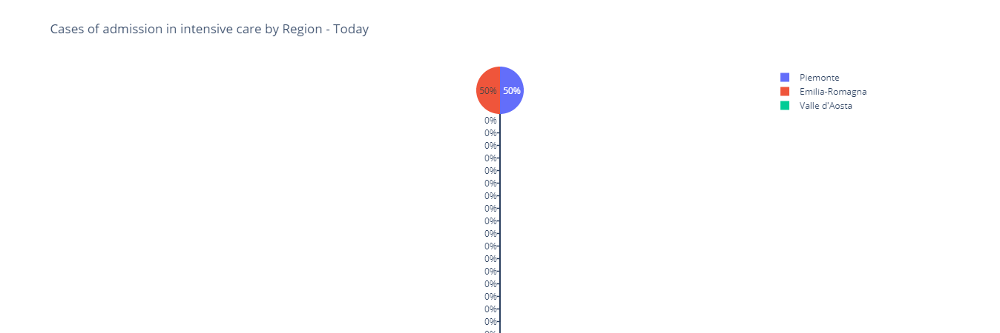

In [ ]:
fig = px.pie(df_regioni_date, values=df_regioni['terapia_intensiva'], names=df_regioni['denominazione_regione'], title='Total cases in intensive care by Region')
fig.show()
fig = px.pie(df_regioni_date, values=df_regioni_date['ingressi_terapia_intensiva'], names=df_regioni_date['denominazione_regione'], title='Cases of admission in intensive care by Region - Today')
fig.show()

#### 3.2.2.4 Total positive cases, home isolation and healed
Here we describe the number of total positve cases to home isolation and healed.

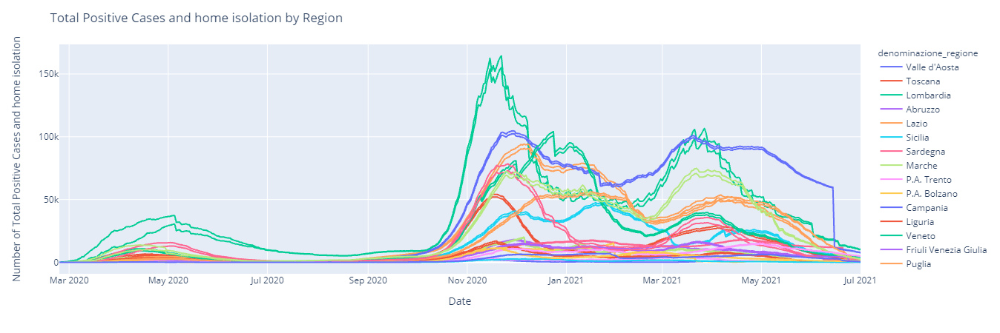

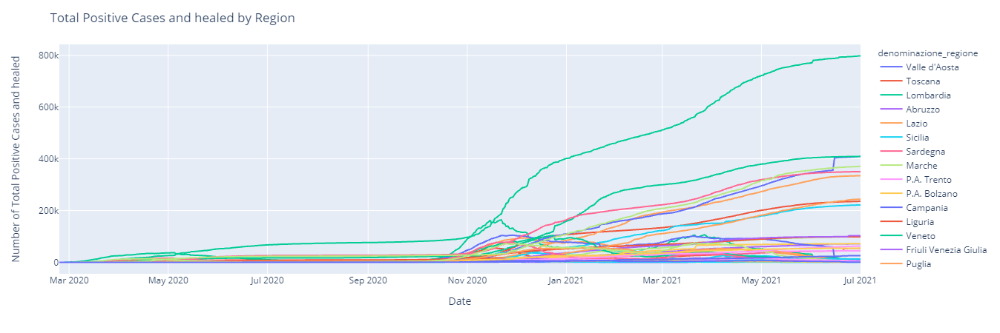

In [ ]:
multiple_lineplot(dataset = df_regioni, subject='denominazione_regione', variable=['totale_positivi', 'isolamento_domiciliare'], title_line='Total Positive Cases and home isolation by Region', y_label_line='Number of Total Positive Cases and home isolation')
multiple_lineplot(dataset = df_regioni, subject='denominazione_regione', variable=['totale_positivi', 'dimessi_guariti'], title_line='Total Positive Cases and healed by Region', y_label_line='Number of Total Positive Cases and healed')

#### 3.2.2.5 Total positive cases and deaths today
Here we describe the number of total positve cases to deaths today.

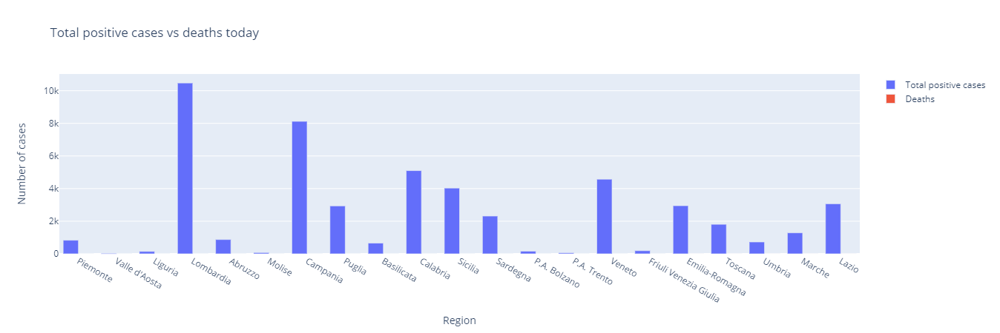

In [ ]:
group_barplot(name='Total positive cases', x=df_regioni_date['denominazione_regione'], y=df_regioni_date['totale_positivi'],
             name1='Deaths', y1=df_regioni['deceduti'],
             title='Total positive cases vs deaths today')

### 3.2.3 Vaccines
Here we try to spot insights about vaccination in Italy, but first we need to load the data from BigQuery.

In [ ]:
query = """
        SELECT *
        FROM `covid-19-analysis-318015.dataset.vaccine`
        """

# Set up the query 
query_job = client.query(query)

# API request - try to run the query, and return a pandas DataFrame
df_vaccine = query_job.to_dataframe()
df_vaccine = df_vaccine.drop(['area', 'codice_NUTS1', 'codice_NUTS2', 'codice_regione_ISTAT'], axis=1)
df_vaccine.head(10)

,data_somministrazione,fornitore,fascia_anagrafica,sesso_maschile,sesso_femminile,prima_dose,seconda_dose,nome_area
0,2021-04-03,Janssen,60-69,1,0,1,0,Piemonte
1,2021-04-24,Janssen,60-69,9,20,29,0,Piemonte
2,2021-04-24,Janssen,70-79,84,113,197,0,Piemonte
3,2021-04-25,Janssen,60-69,85,89,174,0,Piemonte
4,2021-04-25,Janssen,70-79,1,1,2,0,Piemonte
5,2021-04-26,Janssen,60-69,39,46,85,0,Piemonte
6,2021-04-26,Janssen,70-79,19,22,41,0,Piemonte
7,2021-04-28,Janssen,60-69,24,21,45,0,Piemonte
8,2021-04-28,Janssen,70-79,21,20,41,0,Piemonte
9,2021-04-29,Janssen,60-69,187,228,415,0,Piemonte


In [ ]:
df_vaccine.shape

(80297, 8)

In [ ]:
df_vaccine.describe()

,sesso_maschile,sesso_femminile,prima_dose,seconda_dose
count,80297.000000,80297.000000,80297.000000,80297.000000
mean,298.035655,346.209871,424.878451,219.367075
std,860.609770,925.064144,1400.047052,801.348471
min,0.000000,0.000000,0.000000,0.000000
25%,8.000000,9.000000,7.000000,0.000000
50%,48.000000,61.000000,50.000000,10.000000
75%,216.000000,274.000000,265.000000,114.000000
max,23755.000000,20454.000000,43820.000000,27682.000000


In [ ]:
df_vaccine.isnull().mean().round(4).mul(100).sort_values(ascending=False)

data_somministrazione    0.0
fornitore                0.0
fascia_anagrafica        0.0
sesso_maschile           0.0
sesso_femminile          0.0
prima_dose               0.0
seconda_dose             0.0
nome_area                0.0
dtype: float64

In [ ]:
df_vaccine_tot = df_vaccine.drop(['nome_area'], axis=1)
df_vaccine_tot = df_vaccine_tot.groupby(['data_somministrazione']).sum().reset_index()

In [ ]:
def lineplot_vac_plotly(dataset, variable, title):
    fig = px.line(dataset, x='data_somministrazione', y=variable, title=title)
    fig.show()

def boxplot_vac_plotly(dataset, variable, title):
    fig = px.box(dataset, y=variable)
    fig.update_layout(title=title)
    fig.show()

#### 3.2.3.1 Number of shots by Gender
Here we find insights about shots by Gender

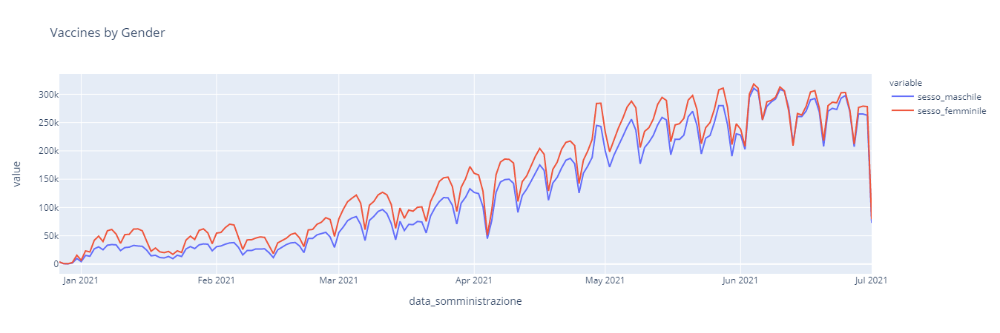

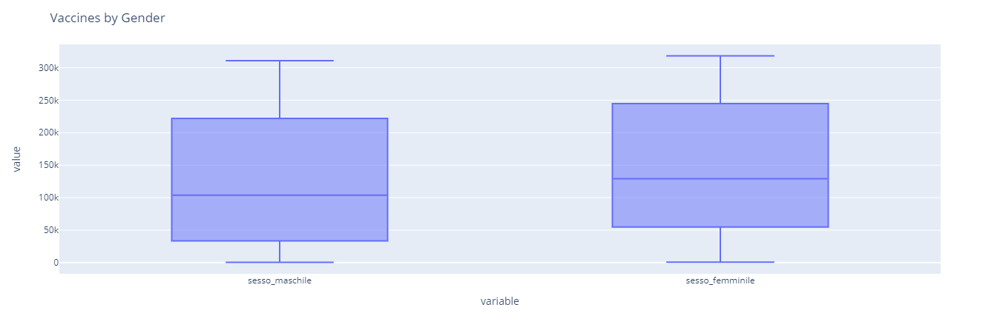

In [ ]:
lineplot_vac_plotly(dataset=df_vaccine_tot, variable = ['sesso_maschile','sesso_femminile'], title='Vaccines by Gender')
boxplot_vac_plotly(dataset=df_vaccine_tot, variable = ['sesso_maschile','sesso_femminile'], title='Vaccines by Gender')

#### 3.2.3.2 Number of shots by Age range
Here we find insights about shots by Age range

In [ ]:
def multiple_vac_boxplot(dataset, subject, variable, title_box, x_label_box, y_label_box, ):
    fig = px.box(dataset, x=subject, y=variable, color=subject)
    fig.update_layout(title=title_box, xaxis_title=x_label_box, yaxis_title=y_label_box)
    fig.show()
    
def multiple_vac_lineplot(dataset, subject, variable, title_line, y_label_line):
    fig = px.line(dataset, x='data_somministrazione', y=variable, color=subject)
    fig.update_layout(title=title_line, xaxis_title='Date', yaxis_title=y_label_line)
    fig.show()

In [ ]:
multiple_vac_boxplot(dataset = df_vaccine, subject='nome_area', variable='fascia_anagrafica', title_box='Vaccine by Age range', x_label_box='Region',y_label_box='Age range')
multiple_vac_lineplot(dataset = df_vaccine, subject='fascia_anagrafica', variable=['fascia_anagrafica','prima_dose'], title_line='First shot by Age range', y_label_line="Date")
multiple_vac_lineplot(dataset = df_vaccine, subject='fascia_anagrafica', variable=['fascia_anagrafica','seconda_dose'], title_line='Second shot by Age range', y_label_line="Date")

#### 3.2.3.3 Number of shots by Gender and Age range
Here we find insights about shots by Gender and Age range

In [ ]:
df_vaccine_manufacturer = df_vaccine.drop(['nome_area','data_somministrazione','prima_dose','seconda_dose'], axis=1)
df_vaccine_manufacturer = df_vaccine_manufacturer.groupby(['fornitore','fascia_anagrafica']).sum(['sesso_maschile','sesso_femminile']).reset_index()
df_vaccine_manufacturer_male = df_vaccine_manufacturer.drop(['sesso_femminile'], axis=1)
df_vaccine_manufacturer_female = df_vaccine_manufacturer.drop(['sesso_maschile'], axis=1)

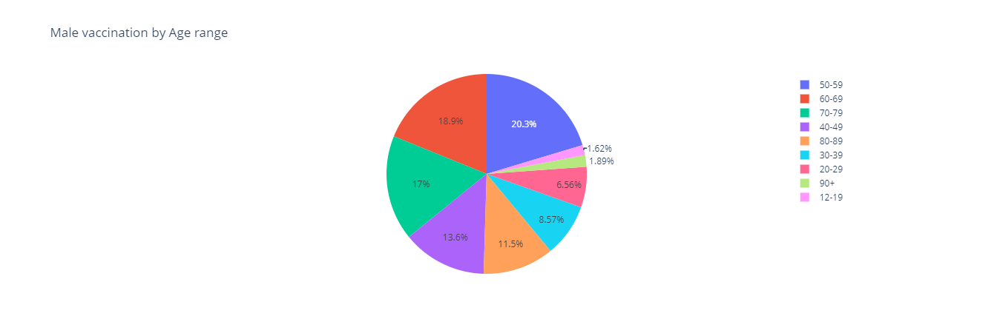

In [ ]:
fig = px.pie(df_vaccine_manufacturer_male, values='sesso_maschile', names=df_vaccine_manufacturer_male['fascia_anagrafica'], title='Male vaccination by Age range')
fig.show()

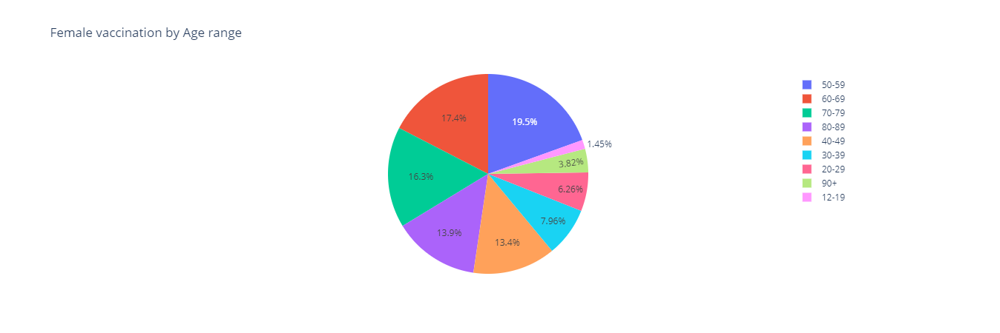

In [ ]:
fig = px.pie(df_vaccine_manufacturer_female, values='sesso_femminile', names=df_vaccine_manufacturer_female['fascia_anagrafica'], title='Female vaccination by Age range')
fig.show()

#### 3.2.3.4 Number of shots by Gender, age range and manufacturer
Here we find insights about shots by Gender, Age range and manufacturer

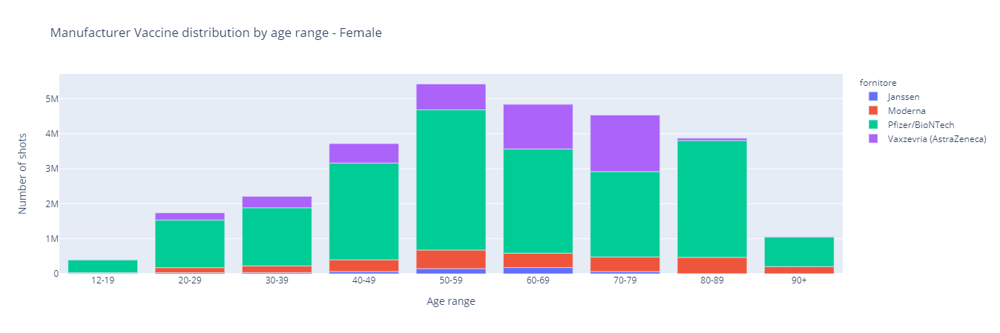

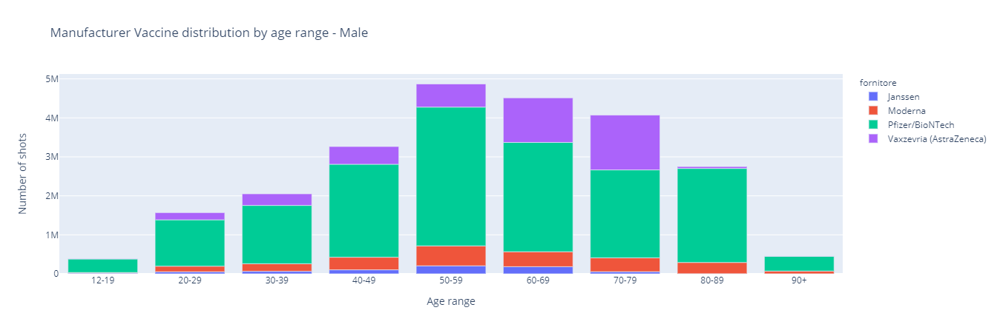

In [ ]:
fig = px.bar(df_vaccine_manufacturer_female, x='fascia_anagrafica', y='sesso_femminile', color="fornitore", title="Manufacturer Vaccine distribution by age range - Female")
fig.update_layout(xaxis_title='Age range', yaxis_title='Number of shots')
fig.show()
fig = px.bar(df_vaccine_manufacturer_male, x='fascia_anagrafica', y='sesso_maschile', color="fornitore", title="Manufacturer Vaccine distribution by age range - Male")
fig.update_layout(xaxis_title='Age range', yaxis_title='Number of shots')
fig.show()

#### 3.2.3.5 Number of shots by Region
Here we find insights about shots by Region

In [ ]:
df_vaccine_region = df_vaccine.drop(['fornitore','data_somministrazione','sesso_maschile','sesso_femminile'], axis=1)
df_vaccine_region = df_vaccine_region.groupby(['nome_area']).sum(['sesso_maschile','sesso_femminile']).reset_index()

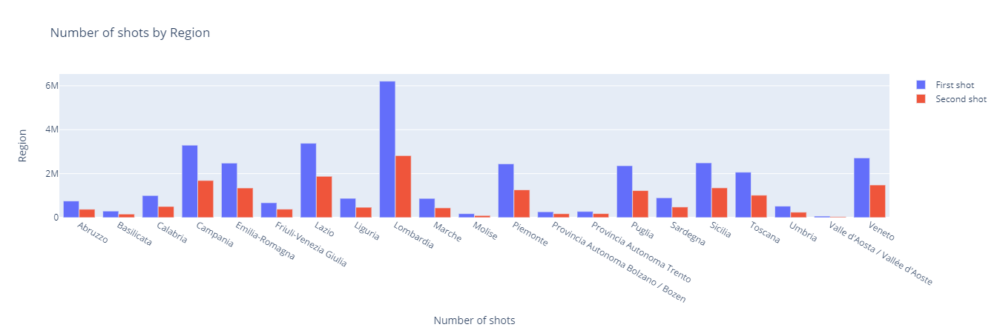

In [ ]:
fig = go.Figure(data=[
    go.Bar(name='First shot', x=df_vaccine_region['nome_area'], y=df_vaccine_region['prima_dose']),
    go.Bar(name='Second shot', x=df_vaccine_region['nome_area'], y=df_vaccine_region['seconda_dose'])
    ])
# Change the bar mode
fig.update_layout(title='Number of shots by Region', yaxis_title='Region', xaxis_title='Number of shots', barmode='group')
fig.show()